In [1]:
import sys
sys.path.append("..")

import dataInterpreter as dt
import numpy as np
import matplotlib.pyplot as plt
import pandas as pd
import scipy.cluster.hierarchy as sch
from sklearn.cluster import AgglomerativeClustering 
from scipy.cluster.hierarchy import linkage, fcluster
from scipy.spatial.distance import squareform
from sklearn.metrics import adjusted_rand_score

In [29]:
columns_sars_cov2 = dt.get_columns('NHBE', 'sars-cov2')
columns_iav = dt.get_columns('NHBE', 'iav')

data = dt.get_complete_data()[columns_sars_cov2 + columns_iav]
data = data.T.loc[:, data.T.apply(pd.Series.nunique) != 1].T # remove constant rows
data

,Series1_NHBE_SARS-CoV-2_1,Series1_NHBE_SARS-CoV-2_2,Series1_NHBE_SARS-CoV-2_3,Series9_NHBE_IAV_1,Series9_NHBE_IAV_2,Series9_NHBE_IAV_3,Series9_NHBE_IAV_4
WASH7P,3.555348,2.995732,3.806662,4.634729,3.295837,3.091042,2.079442
LOC729737,4.852030,4.442651,5.602119,4.682131,3.637586,3.433987,2.397895
LOC100133331,2.833213,3.178054,4.007333,3.526361,2.397895,2.484907,1.386294
LOC100288069,2.995732,2.302585,3.931826,1.609438,1.609438,0.693147,0.693147
LINC00115,2.564949,2.079442,3.367296,2.708050,0.693147,0.000000,0.693147
FAM41C,0.000000,0.693147,0.000000,0.000000,0.000000,0.000000,0.000000
SAMD11,3.295837,2.397895,4.158883,0.000000,0.000000,1.098612,1.098612
NOC2L,7.557995,7.381502,8.549273,8.505323,7.119636,7.088409,6.354370
KLHL17,5.129899,4.369448,5.493061,6.352629,5.023881,4.941642,3.988984
PLEKHN1,5.231109,4.795791,6.001415,6.405228,4.795791,5.056246,4.644391


In [31]:
filtered_data = dt.get_p_values('mannwhitneyu', data, columns_sars_cov2, columns_iav)
filtered_data

ValueError: cannot insert p-value, already exists

In [22]:
filtered_data.drop(['p-value'], axis = 1, inplace = True)

KeyError: "['p-value'] not found in axis"

In [24]:
labels = []

for col in filtered_data.columns:
    info = dt.get_info_from_name(col)
    labels += ['%s %s (S%s)' % (info['Condition'], info['Cell Type'], info['Series'].split('Series')[1])]

labels

['SARS-CoV-2 NHBE (S1)',
 'SARS-CoV-2 NHBE (S1)',
 'SARS-CoV-2 NHBE (S1)',
 'IAV NHBE (S9)',
 'IAV NHBE (S9)',
 'IAV NHBE (S9)',
 'IAV NHBE (S9)']

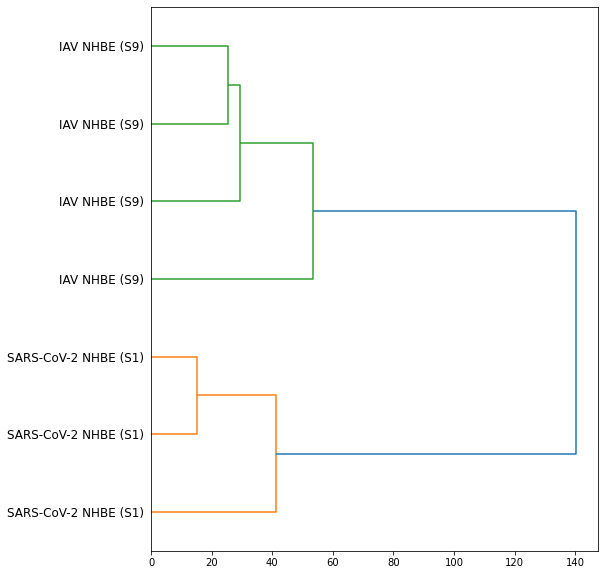

In [27]:
fig = plt.figure(figsize=(8, 10))

dendrogram = sch.dendrogram(sch.linkage(filtered_data.T, method="ward") , labels = labels, orientation='right')
plt.show()

In [7]:
labels = {}

models = AgglomerativeClustering(n_clusters = 3, affinity = 'euclidean', linkage ='ward')
labels['distance'] = models.fit_predict(filtered_data)

In [8]:
labels['distance']

array([2, 2, 1, ..., 0, 0, 2], dtype=int64)

In [15]:
dissimilarity = 1 - np.abs(filtered_data.T.corr())
hierarchy = linkage(squareform(dissimilarity), method='ward')
labels['pearson'] = fcluster(np.clip(hierarchy, 0, None), 3, criterion='maxclust') - 1

C:\Users\Pedro\anaconda3\lib\site-packages\scipy\cluster\hierarchy.py:2267: RuntimeWarning: invalid value encountered in less
  if (Z[:, 2] < 0).any():


In [16]:
labels['pearson']

array([0, 1, 2, ..., 2, 2, 1], dtype=int32)

In [12]:
dissimilarity = 1 - np.abs(filtered_data.T.corr(method='spearman'))
hierarchy = linkage(squareform(dissimilarity), method='ward')
labels['spearman'] = fcluster(hierarchy, 3, criterion='maxclust') - 1

In [13]:
labels['spearman']

array([0, 0, 1, ..., 1, 1, 0], dtype=int32)

In [17]:
from itertools import groupby

clusters = {}

for key1, label1 in labels.items():
    clusters[key1] = [list(map(lambda x: x[0], v)) for k,v in groupby(sorted(zip(filtered_data.index, labels['spearman']), key = lambda x: x[1]), lambda s: s[1])]
    
    for key2, label2 in labels.items():
        if key1 != key2:
            print(key1, ' vs ', key2, ': ', adjusted_rand_score(label1, label2))

distance  vs  spearman :  0.09483265603645298
distance  vs  pearson :  0.21085549438681658
spearman  vs  distance :  0.09483265603645298
spearman  vs  pearson :  0.3625422777127171
pearson  vs  distance :  0.21085549438681658
pearson  vs  spearman :  0.3625422777127171


In [ ]:
i = 0
for c in clusters['distance']:
    print("\n\nCluster", i, ":\n")
    i += 1
    for x in c:
        print(x)

In [ ]:
i = 0
for c in clusters['pearson']:
    print("\n\nCluster", i, ":\n")
    i += 1
    for x in c:
        print(x)

In [ ]:
i = 0
for c in clusters['spearman']:
    print("\n\nCluster", i, ":\n")
    i += 1
    for x in c:
        print(x)

In [18]:
import enrichmentAnalysis as ea

results_enrichment = {'distance': [], 'pearson': [], 'spearman': []}

for cluster_type in clusters:
    for cluster in clusters[cluster_type]:
        results_enrichment[cluster_type] += [ea.getEnrichment(list(cluster), 'GO_Biological_Process_2021')['GO_Biological_Process_2021']]

results_enrichment

Order of returned results is: Rank, Term name, P-value, Z-score, Combined score, Overlapping genes, Adjusted p-value, Old p-value, Old adjusted p-value
Order of returned results is: Rank, Term name, P-value, Z-score, Combined score, Overlapping genes, Adjusted p-value, Old p-value, Old adjusted p-value
Order of returned results is: Rank, Term name, P-value, Z-score, Combined score, Overlapping genes, Adjusted p-value, Old p-value, Old adjusted p-value
Order of returned results is: Rank, Term name, P-value, Z-score, Combined score, Overlapping genes, Adjusted p-value, Old p-value, Old adjusted p-value
Order of returned results is: Rank, Term name, P-value, Z-score, Combined score, Overlapping genes, Adjusted p-value, Old p-value, Old adjusted p-value
Order of returned results is: Rank, Term name, P-value, Z-score, Combined score, Overlapping genes, Adjusted p-value, Old p-value, Old adjusted p-value
Order of returned results is: Rank, Term name, P-value, Z-score, Combined score, Overlap

{'distance': [[[1,
    'positive regulation of vascular permeability (GO:0043117)',
    0.0002664409154792487,
    12.51754269826559,
    103.02385824350972,
    ['OCLN', 'ANGPT1', 'TRPV4', 'FGFBP3', 'TJP3'],
    0.39883989993997937,
    0,
    0],
   [2,
    'regulation of cytokine production (GO:0001817)',
    0.0004922076698623958,
    2.5582553847256566,
    19.485233129657825,
    ['BTN2A2',
     'BTN3A1',
     'TREX1',
     'HILPDA',
     'BTN3A3',
     'MIF',
     'GATA3',
     'VTCN1',
     'BTN3A2',
     'CLEC4A',
     'FGR',
     'IL6',
     'GPNMB',
     'SYT11',
     'ALOX5',
     'LEP',
     'SAA1',
     'LGALS9',
     'ICOSLG'],
    0.39883989993997937,
    0,
    0],
   [3,
    'unsaturated fatty acid metabolic process (GO:0033559)',
    0.000567557385852257,
    3.993566954460809,
    29.848593105534707,
    ['CYP2J2',
     'CYP2D6',
     'ALOX5',
     'CYP4F2',
     'PLA2G4C',
     'CYP4F3',
     'EPHX1',
     'SCD5',
     'ALOX15B',
     'FADS1'],
    0.39883989993997

In [19]:
import json

with open('results_NHBE_virus.json', 'w') as file:
     file.write(json.dumps(results_enrichment)) # use `json.loads` to do the reverse

In [32]:
import json

with open('results_NHBE_virus.json') as file:
    results_enrichment = json.load(file)

In [33]:
dataset = {'p-value': [], 'Score': [], 'Cluster': []}
index = []

for cluster_num in range(len(results_enrichment['distance'])):
    for term in results_enrichment['distance'][cluster_num]:
        index += [term[1]]
        dataset['p-value'] += [term[6]]
        dataset['Score'] += [term[4]]
        dataset['Cluster'] += [cluster_num]
enrichment_dataset = pd.DataFrame(dataset, index = index)

In [34]:
pd.set_option("display.max_rows", None)
selection = enrichment_dataset[enrichment_dataset['p-value'] < 0.01].sort_values('Score', ascending = False).head(25)

selection['p-value'] = selection['p-value'].map(lambda x: '%.2E' % x)
selection['Score'] = selection['Score'].map(lambda x: '%.2f' % x)

#selection.to_csv('NHBE_table.csv')
selection

,p-value,Score,Cluster


## Clustering on columns

NameError: name 'title' is not defined

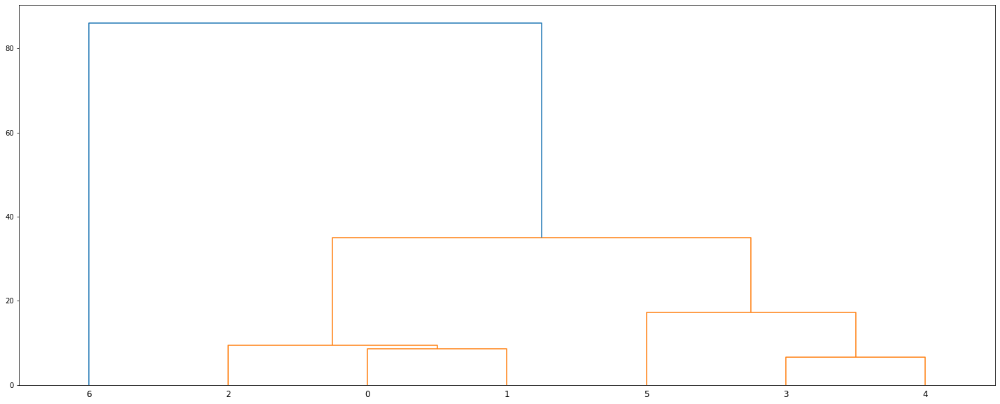

In [13]:
fig = plt.figure(figsize=(25, 10))
dendrogram = sch.dendrogram(sch.linkage(filtered_data.T, method="ward"))
plt.title(title)
plt.xlabel()
plt.ylabel('Distances')
plt.show()

In [108]:
labels_columns = {}

models = AgglomerativeClustering(n_clusters = 2, affinity = 'euclidean', linkage ='ward')
labels_columns['distance'] = models.fit_predict(filtered_data.T)

labels_columns['distance']

array([1, 1, 1, 0, 0, 0], dtype=int64)